## TOC:
* [First Bullet Header](#first-bullet)
* [Second Bullet Header](#second-bullet)

In [ ]:
%pip install rasterio
%pip install geopandas
%pip install folium
%pip install matplotlib
%pip install numpy
%pip install geopy
%pip install pykrige

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# 2. Tipos de Dados Geoespaciais <a class="anchor" id="first-bullet"></a>
Objetivo: Aprender a manipular arquivos geoespaciais (shapefiles, GeoJSON, raster) e transformá-los para análise.



# 2.1 Trabalhando com Dados Vetoriais

Os dados vetoriais são representações espaciais baseadas em pontos, linhas e polígonos. Esses dados são amplamente utilizados em aplicações geoespaciais para modelar características do mundo real, como limites políticos, rodovias, rios e infraestrutura urbana.

Um dos formatos mais comuns para armazenar dados vetoriais é o **Shapefile (.shp)**, desenvolvido pela ESRI. Ele é composto por múltiplos arquivos auxiliares (como pode ser visto no diretorio datasets/Brasil_UF):
- **.shp**: Armazena a geometria dos objetos espaciais.
- **.shx**: Índice espacial das geometrias.
- **.dbf**: Tabela de atributos contendo informações descritivas sobre os objetos.
- **.prj**: Define o sistema de coordenadas do arquivo.


Neste notebook, vamos carregar um shapefile contendo os limites das unidades federativas do Brasil e explorar sua estrutura.

In [2]:
import geopandas as gpd

#Usando ShapeFile
BASE_DIR = "datasets"
shapefile_path = f"{BASE_DIR}/RJ_2023/RJ_Municipios_2023.shp"  # Shapefile das Unidades da Federacao brasileira
gdf_shp = gpd.read_file(shapefile_path)

gdf_shp.head()

,CD_MUN,NM_MUN,CD_RGI,NM_RGI,CD_RGINT,NM_RGINT,CD_UF,NM_UF,CD_REGIAO,NM_REGIAO,CD_CONCURB,NM_CONCURB,AREA_KM2,geometry
0,3300100,Angra dos Reis,330002,Angra dos Reis,3301,Rio de Janeiro,33,Rio de Janeiro,3,Sudeste,3300100,Angra dos Reis,813.420,"MULTIPOLYGON (((-44.51649 -23.03589, -44.51633..."
1,3300159,Aperibé,330012,Santo Antônio de Pádua,3304,Campos dos Goytacazes,33,Rio de Janeiro,3,Sudeste,None,None,94.542,"POLYGON ((-42.11437 -21.61204, -42.11394 -21.6..."
2,3300209,Araruama,330013,Cabo Frio,3305,Macaé - Rio das Ostras - Cabo Frio,33,Rio de Janeiro,3,Sudeste,3300209,Araruama/RJ,638.276,"POLYGON ((-42.28399 -22.93928, -42.28444 -22.9..."
3,3300225,Areal,330007,Petrópolis,3303,Petrópolis,33,Rio de Janeiro,3,Sudeste,3303906,Petrópolis/RJ,110.724,"POLYGON ((-43.09004 -22.23844, -43.09135 -22.2..."
4,3300233,Armação dos Búzios,330013,Cabo Frio,3305,Macaé - Rio das Ostras - Cabo Frio,33,Rio de Janeiro,3,Sudeste,3300704,Cabo Frio/RJ,70.977,"MULTIPOLYGON (((-41.88151 -22.74808, -41.88153..."


Outro formato bastante utilizado é o **GeoJSON (.geojson)**, que é baseado em JSON e amplamente adotado devido à sua compatibilidade com aplicações web. A maior diferença entre esses dataframes e um dataframe comum é a coluna geometry, que contém objetos espaciais do tipo POLYGON ou MULTIPOLYGON que representam áreas geográficas com coordenadas de latitude e longitude.


In [3]:
#Usando GeoJson
geojson_path = f"{BASE_DIR}/br_states.json"
gdf = gpd.read_file(geojson_path)

gdf.head()

,id,FID_Export,SIGLA,Total,Homens,Mulheres,Urbana,Rural,TX_Alfab,FID_estado,Estado,FK_macro,PK_sigla,geometry
0,AC,0,AC,557526,280983,276543,370267,187259,65.154545,-1,Acre,N,AC,"MULTIPOLYGON (((-66.80619 -9.81446, -66.64485 ..."
1,AL,1,AL,2822621,1378942,1443679,1919739,902882,59.364356,-1,Alagoas,NE,AL,"MULTIPOLYGON (((-35.15263 -8.91373, -35.15628 ..."
2,AM,2,AM,2812557,1414367,1398190,2107222,705335,72.250000,-1,Amazonas,N,AM,"MULTIPOLYGON (((-67.3259 2.02976, -67.30001 1...."
3,AP,3,AP,477032,239453,237579,424683,52349,83.650000,-1,Amapá,N,AP,"MULTIPOLYGON (((-50.09389 0.70205, -50.15695 0..."
4,BA,4,BA,13070250,6462033,6608217,8772348,4297902,71.163373,-1,Bahia,NE,BA,"MULTIPOLYGON (((-38.64899 -18.03612, -38.65822..."


In [4]:
gdf_shp.info() # Exibir informações gerais do GeoDataFrame
print("\n-----\n")
gdf_shp.crs # Verificar a projeção cartográfica

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   CD_MUN      92 non-null     object  
 1   NM_MUN      92 non-null     object  
 2   CD_RGI      92 non-null     object  
 3   NM_RGI      92 non-null     object  
 4   CD_RGINT    92 non-null     object  
 5   NM_RGINT    92 non-null     object  
 6   CD_UF       92 non-null     object  
 7   NM_UF       92 non-null     object  
 8   CD_REGIAO   92 non-null     object  
 9   NM_REGIAO   92 non-null     object  
 10  CD_CONCURB  49 non-null     object  
 11  NM_CONCURB  49 non-null     object  
 12  AREA_KM2    92 non-null     float64 
 13  geometry    92 non-null     geometry
dtypes: float64(1), geometry(1), object(12)
memory usage: 10.2+ KB

-----



<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Visualizacao de dados vetoriais

In [5]:
import folium

# Mapa centralizado no Brasil
mapa = folium.Map(location=[-22.9068, -43.1729], zoom_start=8)

# Adicionar os limites das unidades federativas
for _, row in gdf_shp.iterrows():
    folium.GeoJson(
        row["geometry"],
        name=row["NM_MUN"],
        tooltip=str(row["AREA_KM2"]) + " km²",
        style_function=lambda x: {"color": "blue"},
    ).add_to(mapa)


mapa

# 2.2 Trabalhando com Dados Raster

Os dados raster representam superfícies contínuas e são compostos por uma grade regular de células (pixels).
Eles são usados para representar imagens de satélite, modelos digitais de elevação (MDE) e outras informações geoespaciais.
Cada pixel contém um valor que representa uma característica da superfície.

Como os dados raster funcionam como um bitmap (ou seja, uma matriz de valores organizados em células/pixels), eles permitem representar informações contínuas sobre superfícies geográficas. O formato TIFF (Tagged Image File Format), especialmente na sua variação GeoTIFF, é amplamente utilizado para armazenar dados raster geoespaciais. Ele já vem com metadados embutidos, o que facilita a extração de informações espaciais e a integração com ferramentas de análise geográfica. 

In [6]:
import rasterio


arquivo_raster = f"{BASE_DIR}/World_Temp_geotiff/data/TEMP.tif"

# Carrega um arquivo raster da temperatura global
with rasterio.open(arquivo_raster) as src:
    print(f"Formato: {src.driver}")
    print(f"Dimensões (Linhas, Colunas): {src.height}, {src.width}")
    print(f"Número de bandas: {src.count}")
    print(f"Sistema de Coordenadas: {src.crs}")


RasterioIOError: datasets/World_Temp_geotiff/data/TEMP.tif: No such file or directory

**Extraindo e Visualizando os Dados**
Os dados raster geralmente possuem múltiplas bandas (camadas). Vamos visualizar a primeira banda da imagem:

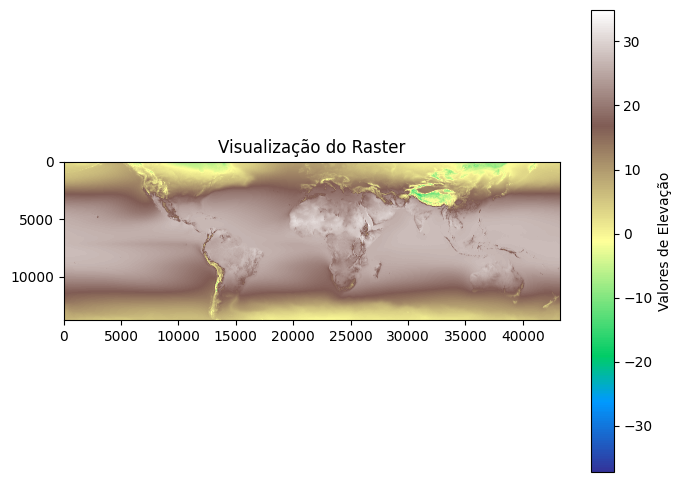

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Lendo a primeira banda do raster
with rasterio.open(arquivo_raster) as src:
    raster_data = src.read(1)  # Lendo a primeira banda

# Visualizando a matriz raster
plt.figure(figsize=(8, 6))
plt.imshow(raster_data, cmap="terrain")
plt.colorbar(label="Valores de Elevação")
plt.title("Visualização do Raster")
plt.show()


**Estatísticas Básicas do Raster**

A partir dessa matriz ja eh possivel extrair algumas informacoes que podem ser interessentes

In [ ]:
print(f"Mínima Temperatura: {np.min(raster_data)}")
print(f"Máxima Temperatura: {np.max(raster_data)}")
print(f"Temperatura Média: {np.mean(raster_data)}")
print(f"Desvio Padrao: {np.std(raster_data)}")

Mínima Temperatura: -37.20000076293945
Máxima Temperatura: 34.900001525878906
Temperatura Média: 17.61301612854004
Desvio Padrao: 8.891693115234375


**Recorte de Raster Usando um Shapefile (Rio de Janeiro)**

É comum precisar recortar um raster para uma área de interesse usando um shapefile (usaremos o shp do Rio utilizado na Secao 1.1). Podemos fazer isso com rasterio.mask:

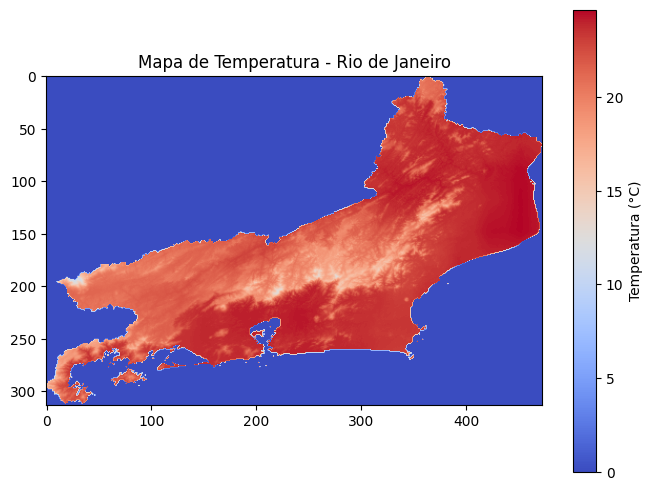

In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import matplotlib.pyplot as plt


# Carregar o shapefile
rio = gpd.read_file(shapefile_path)

# Abrir o raster e recortar com base na geometria do shapefile
with rasterio.open(arquivo_raster) as src:
    rio = rio.to_crs(src.crs)  # Garantir que ambos têm o mesmo sistema de coordenadas
    out_image, out_transform = mask(src, rio.geometry, crop=True)
    out_meta = src.meta  # Guardar metadados do raster original

# Exibir o raster recortado (Mapa de Temperatura)
plt.figure(figsize=(8, 6))
plt.imshow(out_image[0], cmap="coolwarm")  # Cores azul-vermelho para temperatura
plt.colorbar(label="Temperatura (°C)")
plt.title("Mapa de Temperatura - Rio de Janeiro")
plt.show()

In [ ]:
import numpy as np

# Filtrar apenas os valores válidos (excluindo NoData)
valid_pixels = out_image[0][out_image[0] > -50]  # Temperaturas reais devem estar acima de -50°C

# Cálculo das estatísticas
temp_min = np.min(valid_pixels)
temp_max = np.max(valid_pixels)
temp_mean = np.mean(valid_pixels)
temp_std = np.std(valid_pixels)

print(f"🌡️ Estatísticas de Temperatura do Rio de Janeiro:")
print(f"🔹 Temperatura mínima: {temp_min:.2f} °C")
print(f"🔹 Temperatura máxima: {temp_max:.2f} °C")
print(f"🔹 Temperatura média: {temp_mean:.2f} °C")
print(f"🔹 Desvio padrão: {temp_std:.2f} °C")


🌡️ Estatísticas de Temperatura do Rio de Janeiro:
🔹 Temperatura mínima: 0.00 °C
🔹 Temperatura máxima: 24.70 °C
🔹 Temperatura média: 8.25 °C
🔹 Desvio padrão: 10.80 °C


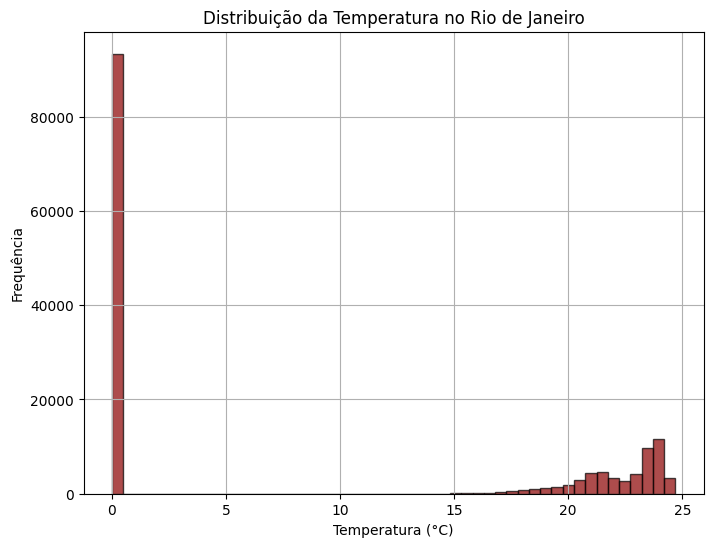

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(valid_pixels, bins=50, color="darkred", alpha=0.7, edgecolor="black")
plt.xlabel("Temperatura (°C)")
plt.ylabel("Frequência")
plt.title("Distribuição da Temperatura no Rio de Janeiro")
plt.grid(True)
plt.show()


**Salvando um Novo Raster**

In [ ]:
with rasterio.open(
    "novo_raster.tif",
    "w",
    driver="GTiff",
    height=out_image.shape[1],
    width=out_image.shape[2],
    count=1,
    dtype=out_image.dtype,
    crs=src.crs,
    transform=out_transform,
) as dest:
    dest.write(out_image[0], 1)


## 2.3 Raster ou Vetorial: Qual formato usar?

Nesta seção, vamos entender a diferença entre os dois formatos mais usados em geociência:

- **Raster**: representações contínuas em grade de pixels (como imagens)
- **Vetorial**: representações geométricas precisas (pontos, linhas, polígonos)

Além da explicação teórica, vamos visualizar a diferença usando dados reais.


### 📊 Comparativo entre Raster e Vetorial

| Tipo de dado | Representação | Estrutura | Exemplo |
|--------------|----------------|-----------|---------|
| **Raster**   | Grade de pixels (imagem) | Matriz regular (grid) | Temperatura, altitude, satélite |
| **Vetorial** | Pontos, linhas e polígonos | Tabelado + geometria | Localização de imóveis, limites de bairros |


### 🧱 Exemplo Vetorial: Usinas Fósseis

Este mapa mostra a localização precisa de usinas fósseis no Brasil, com atributos como tipo de combustível e capacidade em MW.


In [ ]:
import pandas as pd
import geopandas as gpd
import folium
from shapely.geometry import Point

# Carregar dados vetoriais
df_usinas = pd.read_csv("datasets/solar_potential/globalpowerplantdatabasev130/global_power_plant_database.csv")
df_usinas = df_usinas[(df_usinas.country_long == "Brazil") & 
                      (df_usinas.primary_fuel.isin(["Coal", "Gas", "Oil"]))]

# Converter para GeoDataFrame
geometry = [Point(xy) for xy in zip(df_usinas.longitude, df_usinas.latitude)]
gdf_usinas = gpd.GeoDataFrame(df_usinas, geometry=geometry, crs="EPSG:4326")

# Mapa com folium
m_vetorial = folium.Map(location=[-15.0, -47.0], zoom_start=4, tiles="CartoDB positron")
for _, row in gdf_usinas.iterrows():
    folium.CircleMarker(
        location=(row.geometry.y, row.geometry.x),
        radius=4,
        color="red",
        fill=True,
        fill_opacity=0.6,
        popup=f"{row['name']} - {row['capacity_mw']} MW"
    ).add_to(m_vetorial)

m_vetorial


C:\Users\PC\AppData\Local\Temp\ipykernel_22892\4225472443.py:7: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df_usinas = pd.read_csv("datasets/solar_potential/globalpowerplantdatabasev130/global_power_plant_database.csv")


### 🌍 Exemplo Raster: Potencial de Energia Solar (PVOUT)

Neste exemplo, usamos um raster (GeoTIFF) com valores contínuos de potencial de energia solar em kWh/kWp/dia.


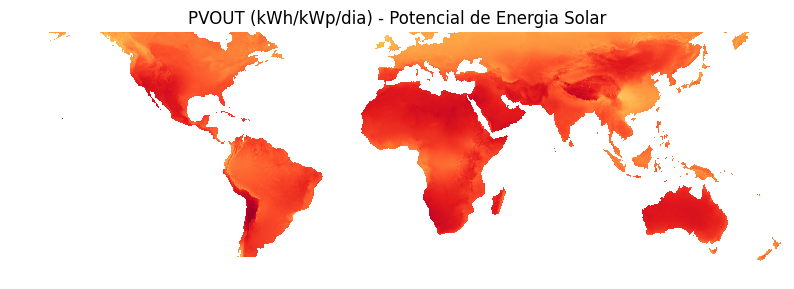

In [ ]:
import rasterio
import matplotlib.pyplot as plt
import rasterio.plot

# Carregar raster PVOUT
src = rasterio.open("datasets\solar_potential\World_PVOUT_GISdata_LTAy_AvgDailyTotals_GlobalSolarAtlas-v2_GEOTIFF\World_PVOUT_GISdata_LTAy_DailySum_GlobalSolarAtlas_GEOTIFF\PVOUT.tif")
fig, ax = plt.subplots(figsize=(10, 6))
rasterio.plot.show(src, ax=ax, cmap="YlOrRd")
plt.title("PVOUT (kWh/kWp/dia) - Potencial de Energia Solar")
plt.axis("off")
plt.show()


### ✅ Conclusão

- Use **vetorial** para representar objetos como imóveis, rios, estradas ou regiões administrativas.
- Use **raster** para fenômenos contínuos como temperatura, irradiação solar, relevo ou uso do solo.
- A combinação dos dois é essencial em muitas análises espaciais modernas.


Tem como converter raster para vetorial e vice-versa.
Tem como usar no mesma visuzlizacao dados raster e vetoriais?